<img align="left" src="images/GMIT-logo.png" alt="GMIT" width="250"/>                                                      <img align="right" src="images/data-analytics.png" alt="HDipDA" width="300"/>  
# <center> Higher Diploma in Data Analytics - Boston House Prices Project </center> #
  

___________________________________________

**Module Name**: Machine Learning & Statistics  
**Module Number**: 52954
**Student Name**: Yvonne Brady  
**Student ID**: G00376355  
___________________________________________  


## (20%) Describe: ##
Create a git repository and make it available online for the lecturer to clone. The repository should contain all your work for this assessment. Within the repository, create a jupyter [6] notebook that uses descriptive statistics and plots to describe the Boston House Prices [1] dataset. This part is worth 20% of your overall mark.

## Introduction ##
This project concerns the Boston House Price Dataset. This dataset is taken from 1970 and records a number of parameters as follows:

**_crim_** : per capita crime rate by town.

**_zn_** : proportion of residential land zoned for lots over 25,000 sq.ft.

**_indus_** : proportion of non-retail business acres per town.

**_chas_** : Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).

**_nox_** : nitrogen oxides concentration (parts per 10 million).

**_rm_** : average number of rooms per dwelling.

**_age_** : proportion of owner-occupied units built prior to 1940.

**_dis_** : weighted mean of distances to five Boston employment centres.

**_rad_** : index of accessibility to radial highways.

**_tax_** : full-value property-tax rate per $10,000.

**_ptratio_** : pupil-teacher ratio by town.

**_black_** : 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town.

**_lstat_** : lower status of the population (percent).

**_medv_** : median value of owner-occupied homes in $1000s.

In [1]:
# First things first - import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as ts ## not ~available and warnings when tried to install - will wait for now
%matplotlib inline 
# Found this and thought it was worth trying ...
import pandas_profiling

In [2]:
from sklearn.datasets import load_boston
bhp = load_boston()

In [3]:
print(bhp.keys())

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])


In [4]:
bhp.DESCR

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

### Just Prettying up the Description ###
**Data Set Characteristics:**  
Number of Instances: 506  
Number of Attributes: 13  
**Numeric/categorical predictive.**  
Median Value (attribute 14) is usually the target.
**Attribute Information (in order):**  
- CRIM     per capita crime rate by town  
- ZN       proportion of residential land zoned for lots over 25,000 sq.ft.  
- INDUS    proportion of non-retail business acres per town  
- CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)  
- NOX      nitric oxides concentration (parts per 10 million)  
- RM       average number of rooms per dwelling  
- AGE      proportion of owner-occupied units built prior to 1940  
- DIS      weighted distances to five Boston employment centres  
- RAD      index of accessibility to radial highways  
- TAX      full-value property-tax rate per \\$10,000  
- PTRATIO  pupil-teacher ratio by town  
- B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town  
- LSTAT    % lower status of the population  
- MEDV     Median value of owner-occupied homes in $1000's

**Missing Attribute Values:** None  

**Creator:** Harrison, D. and Rubinfeld, D.L.  
This is a copy of UCI ML housing dataset.
https://archive.ics.uci.edu/ml/machine-learning-databases/housing/  
This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.  
The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic prices and the demand for clean air', J. Environ. Economics & Management, vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics...', Wiley, 1980.  
N.B. Various transformations are used in the table on pages 244-261 of the latter.  
The Boston house-price data has been used in many machine learning papers that address regression problems.  

**References**  
- Belsley, Kuh & Welsch, 'Regression diagnostics: Identifying Influential Data and Sources of Collinearity', Wiley, 1980. 244-261.  
- Quinlan,R. (1993). Combining Instance-Based and Model-Based Learning. In Proceedings on the Tenth International Conference of Machine Learning, 236-243, University of Massachusetts, Amherst. Morgan Kaufmann.

In [5]:
# Put the data in a dataframe for easier manipulation
boston = pd.DataFrame(bhp.data, columns=bhp.feature_names)
# And have a look at some random data
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
290,0.03502,80.0,4.95,0.0,0.411,6.861,27.9,5.1167,4.0,245.0,19.2,396.90,3.33
110,0.10793,0.0,8.56,0.0,0.520,6.195,54.4,2.7778,5.0,384.0,20.9,393.49,13.00
145,2.37934,0.0,19.58,0.0,0.871,6.130,100.0,1.4191,5.0,403.0,14.7,172.91,27.80
107,0.13117,0.0,8.56,0.0,0.520,6.127,85.2,2.1224,5.0,384.0,20.9,387.69,14.09
387,22.59710,0.0,18.10,0.0,0.700,5.000,89.5,1.5184,24.0,666.0,20.2,396.90,31.99


In [6]:
# There is no MEDV column so we must add it to the dataframe
boston['MEDV'] = bhp.target
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
192,0.08664,45.0,3.44,0.0,0.437,7.178,26.3,6.4798,5.0,398.0,15.2,390.49,2.87,36.4
173,0.09178,0.0,4.05,0.0,0.510,6.416,84.1,2.6463,5.0,296.0,16.6,395.50,9.04,23.6
196,0.04011,80.0,1.52,0.0,0.404,7.287,34.1,7.3090,2.0,329.0,12.6,396.90,4.08,33.3
250,0.14030,22.0,5.86,0.0,0.431,6.487,13.0,7.3967,7.0,330.0,19.1,396.28,5.90,24.4
478,10.23300,0.0,18.10,0.0,0.614,6.185,96.7,2.1705,24.0,666.0,20.2,379.70,18.03,14.6


In [7]:
profile = pandas_profiling.ProfileReport(boston)
profile

In [8]:
profile_chas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 1])
profile_chas

In [9]:
profile_nochas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 0])
profile_nochas

In [10]:
# Check for null values
boston.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

## Start Plotting ##

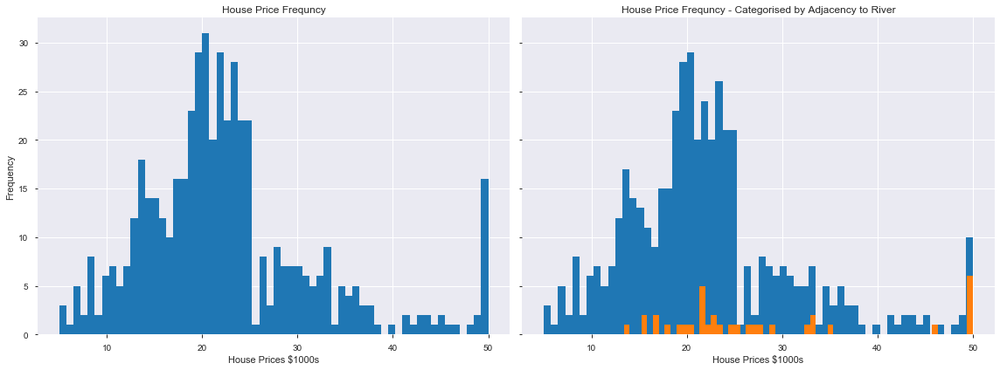

In [11]:

# PLotting histograms showing House Prices in total 
# and where the zone is beside the river
plt.rcParams['figure.figsize'] = [16, 6]
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)
axs[0].set_xlabel('House Prices $1000s')
axs[1].set_xlabel('House Prices $1000s')
axs[0].set_ylabel('Frequency')
axs[0].set_title("House Price Frequncy")
axs[1].set_title("House Price Frequncy - Categorised by Adjacency to River")
axs[0].hist(boston["MEDV"], bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 0.0), bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 1.0), bins = 60)

# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
plt.show()

In [12]:
#Just having a look at the house price element itself
boston["MEDV"].describe()

count    506.000000
mean      22.532806
std        9.197104
min        5.000000
25%       17.025000
50%       21.200000
75%       25.000000
max       50.000000
Name: MEDV, dtype: float64

### What affects house prices? ###
Need to look at each element individually forst to see what affects house prices in particular:  
- CRIM per capita crime rate by town
- ZN proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS proportion of non-retail business acres per town
- NOX nitric oxides concentration (parts per 10 million)
- RM average number of rooms per dwelling
- AGE proportion of owner-occupied units built prior to 1940
- DIS weighted distances to five Boston employment centres
- RAD index of accessibility to radial highways
- TAX full-value property-tax rate per $10,000
- PTRATIO pupil-teacher ratio by town
- B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT % lower status of the population

In [13]:
from scipy import stats
# Get the regression line using all the data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

In [14]:
from tabulate import tabulate

In [15]:
table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+-------------+-------------+-------------+-------------+-------------+
| Category   |       Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+=============+=============+=============+=============+=============+
| CRIM       | -0.36316    |   11.7965   |   -0.388305 | 1.17399e-19 | 0.0383902   |
+------------+-------------+-------------+-------------+-------------+-------------+
| ZN         |  0.914034   |   -9.23212  |    0.360445 | 5.71358e-17 | 0.105363    |
+------------+-------------+-------------+-------------+-------------+-------------+
| INDUS      | -0.360823   |   19.2671   |   -0.483725 | 4.90026e-31 | 0.0290802   |
+------------+-------------+-------------+-------------+-------------+-------------+
| NOX        | -0.00538397 |    0.676011 |   -0.427321 | 7.06504e-24 | 0.000507399 |
+------------+-------------+-------------+-------------+-------------+-------------+
| RM         |  0.0531224  |    5.08764  |    0.69536  | 2.48723e

The table above shows the best correlations with LSTAT (% of population from lower status), which shows an inverse relationship with house price, and RM (number of rooms). This correlates well with the Correlation tables in the profile above. 

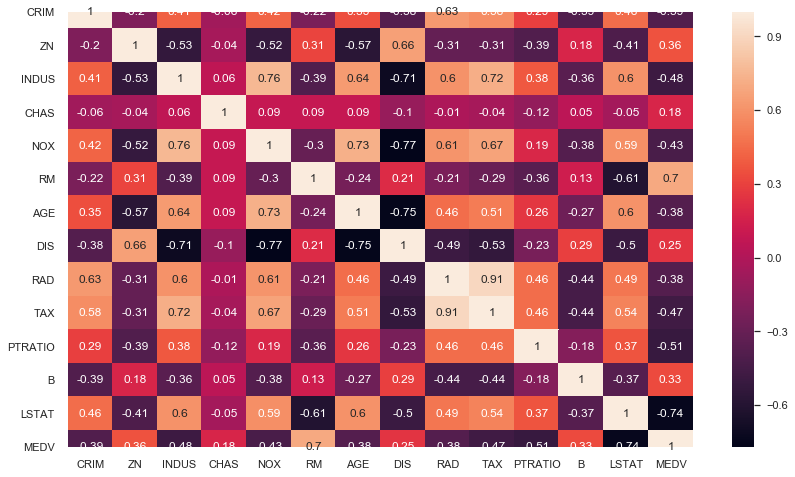

In [16]:
sns.set(rc={'figure.figsize':(14,8)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

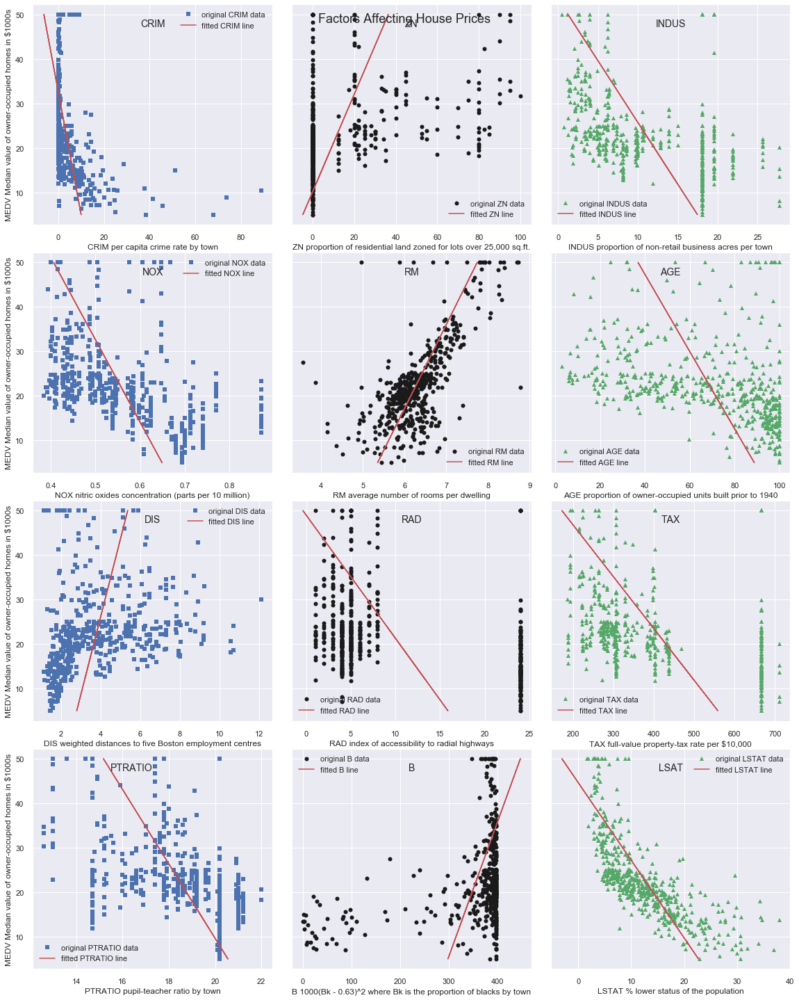

In [17]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

Looking at the plots individually, we can hypothesise on possible correlations. It is likely many of these supposed correlations will be more imagined than real, but we will explore them nonetheless as this may help us spot fake relationships in the future.  
  
**CRIM**: Within the entire dataset there appears to be no relationship, but may warrant further scrutiny where the crime rate is 0.  
**ZN**: Similar to the crime rate. We could look at any relationship where the 0 values are excluded.  
**INDUS**: Could look at excluding house prices under \\$40K   
**NOX**: Similar to INDUS, could exclude the higher priced homes. Unsurprisingly this plot tallies with the INDUS plot.   
**RM**:  A clear linear proportional relationship exists.  
**AGE**: Possible relationship excluding the higher priced homes.  
**DIS**: There may be a $y = a \sqrt{x} $ relationship  
**RAD**: Struggling to find any kind of relationship here.  
**TAX**: Again, no obvious relationship barring a general trend toward higher taxes meaning lower house prices, but the data values are very spread for this to pursue.  
**PTRATIO**: Similar to the TAX plot above  
**B**: Could look at relationship excluding upper-end B values  
**LSTAT**: While this shows one of the best $r^2$ values the shape of the graph may warrant whether a $y=\frac{1}{x}$ may be a better fit here.

It is likely that many of these relationships are not worthy of further investigation.

**Investigation of adjustments described above**

In [18]:
boston_nocrim = boston.loc[boston["CRIM"] > 2]
boston_nozn = boston.loc[boston["ZN"]>5]

In [19]:
crim0_slope, crim0_intercept, crim0_r2, crim0_p, crim0_stdErr = stats.linregress(boston_nocrim["MEDV"], boston_nocrim["CRIM"])
zn0_slope, zn0_intercept, zn0_r2, zn0_p, zn0_stdErr = stats.linregress(boston_nozn["MEDV"], boston_nozn["ZN"])


In [20]:
print("Full dataset r^2 values for CRIM (", len(boston),") vs adjusted CRIM (", len(boston_nocrim),"):", crim_r2, "vs",crim0_r2)
print("Full dataset r^2 values for ZN (", len(boston),") vs adjusted ZN (", len(boston_nozn),"):", zn_r2, "vs", zn0_r2)


Full dataset r^2 values for CRIM ( 506 ) vs adjusted CRIM ( 150 ): -0.3883046085868113 vs -0.3486104206965284
Full dataset r^2 values for ZN ( 506 ) vs adjusted ZN ( 134 ): 0.3604453424505433 vs 0.20841302081053192


**Multi-Linear Regression**  
Looking at the two variables, RM and LSTAt - try using multi-linear regression

In [21]:
# Import linear_model from sklearn
import sklearn.linear_model as ln

In [22]:
# Create a linear regression model instance
m = ln.LinearRegression()

In [23]:
x = boston[["RM","LSTAT"]] # comparing against the best two variables
y = boston["MEDV"]

In [24]:
m.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [25]:
# See how well it fit:
m.score(x,y)

0.6385616062603403

This value is lower than either the RM or LSTAT R2 values!

In [26]:
x = boston[["RM", "INDUS"]]
m.fit(x,y)
m.score(x,y)

0.5362984005856312

In [27]:
# And the data where is is adjacent to the river
boston["MEDV"].where(boston['CHAS'] == 1.0).describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [28]:
# Focus on only the Zones Where CHAS is 1
np.unique(boston[['ZN','CHAS']], axis=0)
boston["ZN"].unique()

array([ 18. ,   0. ,  12.5,  75. ,  21. ,  90. ,  85. , 100. ,  25. ,
        17.5,  80. ,  28. ,  45. ,  60. ,  95. ,  82.5,  30. ,  22. ,
        20. ,  40. ,  55. ,  52.5,  70. ,  34. ,  33. ,  35. ])

In [29]:
boston.loc[boston['CHAS'] == 1]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
142,3.32105,0.0,19.58,1.0,0.8710,5.403,100.0,1.3216,5.0,403.0,14.7,396.90,26.82,13.4
152,1.12658,0.0,19.58,1.0,0.8710,5.012,88.0,1.6102,5.0,403.0,14.7,343.28,12.12,15.3
154,1.41385,0.0,19.58,1.0,0.8710,6.129,96.0,1.7494,5.0,403.0,14.7,321.02,15.12,17.0
155,3.53501,0.0,19.58,1.0,0.8710,6.152,82.6,1.7455,5.0,403.0,14.7,88.01,15.02,15.6
160,1.27346,0.0,19.58,1.0,0.6050,6.250,92.6,1.7984,5.0,403.0,14.7,338.92,5.50,27.0
162,1.83377,0.0,19.58,1.0,0.6050,7.802,98.2,2.0407,5.0,403.0,14.7,389.61,1.92,50.0
163,1.51902,0.0,19.58,1.0,0.6050,8.375,93.9,2.1620,5.0,403.0,14.7,388.45,3.32,50.0
208,0.13587,0.0,10.59,1.0,0.4890,6.064,59.1,4.2392,4.0,277.0,18.6,381.32,14.66,24.4
209,0.43571,0.0,10.59,1.0,0.4890,5.344,100.0,3.8750,4.0,277.0,18.6,396.90,23.09,20.0
210,0.17446,0.0,10.59,1.0,0.4890,5.960,92.1,3.8771,4.0,277.0,18.6,393.25,17.27,21.7


## (20%) Infer: ##
To the above jupyter notebook, add a section where you use inferential
statistics to analyse whether there is a significant difference in median house prices
between houses that are along the Charles river and those that aren’t. You should
explain and discuss your findings within the notebook. This part is also worth
20%.

<img src="images/Charles-River.jpg"/>

In [30]:
# Let#'s have a look at the stats for properties beside the Charles River
boston.loc[boston['CHAS'] == 1].describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,35.000000,35.000000,35.000000,35.0,35.000000,35.000000,35.00000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1.851670,7.714286,12.719143,1.0,0.593426,6.519600,77.50000,3.029709,9.314286,386.257143,17.491429,372.997429,11.241714,28.440000
std,2.494072,18.800143,5.957623,0.0,0.144736,0.876416,22.02134,1.254728,8.248962,165.012004,2.081766,53.382820,6.686651,11.816643
min,0.015010,0.000000,1.210000,1.0,0.401000,5.012000,24.80000,1.129600,1.000000,198.000000,13.600000,88.010000,1.920000,13.400000
25%,0.125060,0.000000,6.410000,1.0,0.489000,5.935500,60.30000,1.904700,4.000000,276.000000,15.650000,376.200000,5.395000,21.100000
50%,0.447910,0.000000,13.890000,1.0,0.550000,6.250000,88.50000,3.048000,5.000000,307.000000,17.600000,390.770000,10.500000,23.300000
75%,3.397665,0.000000,18.100000,1.0,0.693000,6.915000,93.20000,3.897300,8.000000,403.000000,18.600000,393.595000,15.070000,33.150000
max,8.982960,90.000000,19.580000,1.0,0.871000,8.780000,100.00000,5.885000,24.000000,666.000000,20.200000,396.900000,26.820000,50.000000


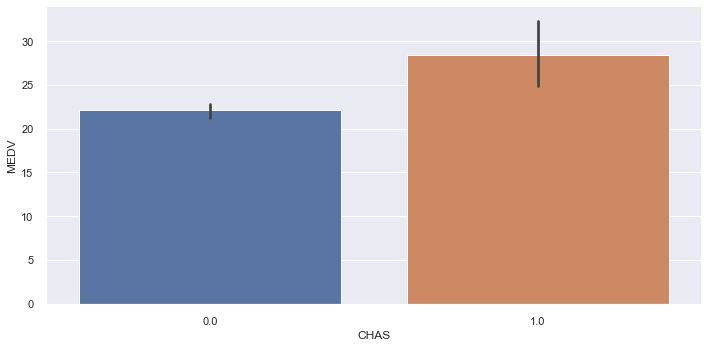

In [31]:
sns.catplot(height=5, aspect=2, x = 'CHAS', y ='MEDV', data = boston, kind = "bar")

In [32]:
boston.loc[boston['CHAS'] == 1]["MEDV"].describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [33]:
boston.loc[boston['CHAS'] == 0]["MEDV"].describe()

count    471.000000
mean      22.093843
std        8.831362
min        5.000000
25%       16.600000
50%       20.900000
75%       24.800000
max       50.000000
Name: MEDV, dtype: float64

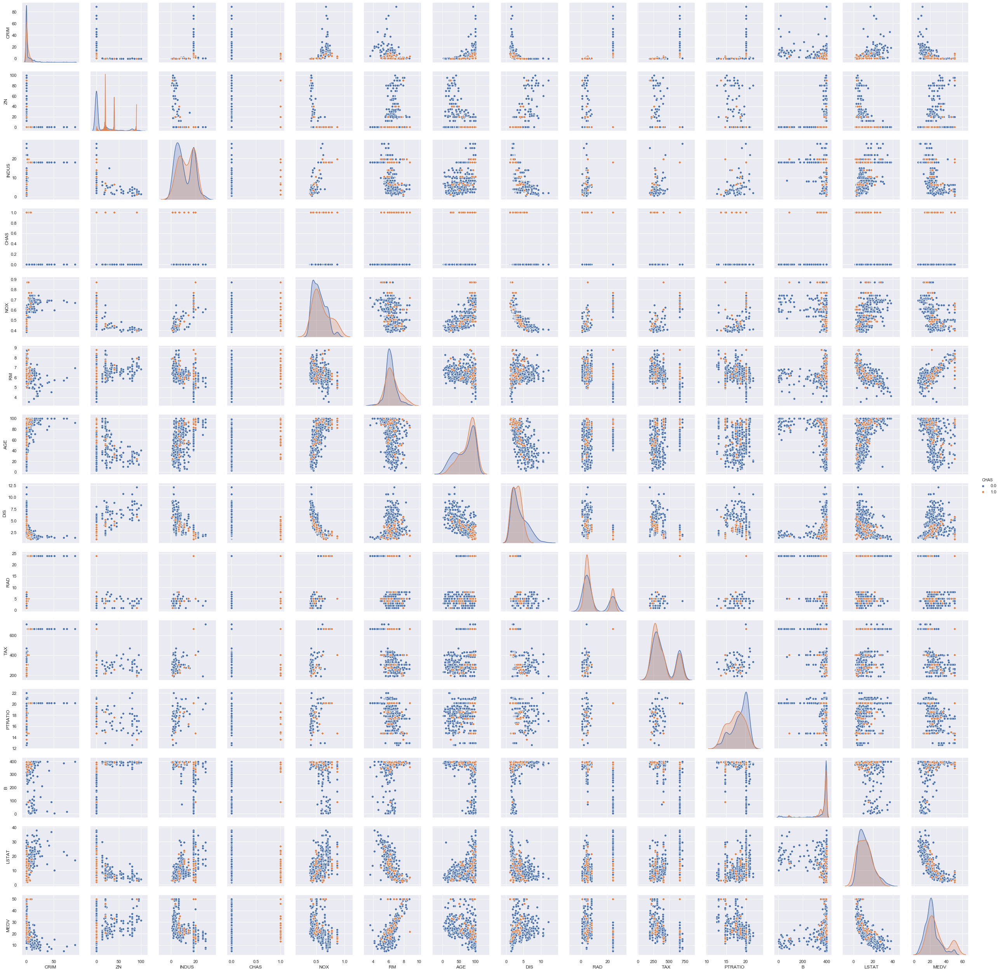

In [34]:
# A 14 x14 plot! 
sns.pairplot(boston, hue = "CHAS")

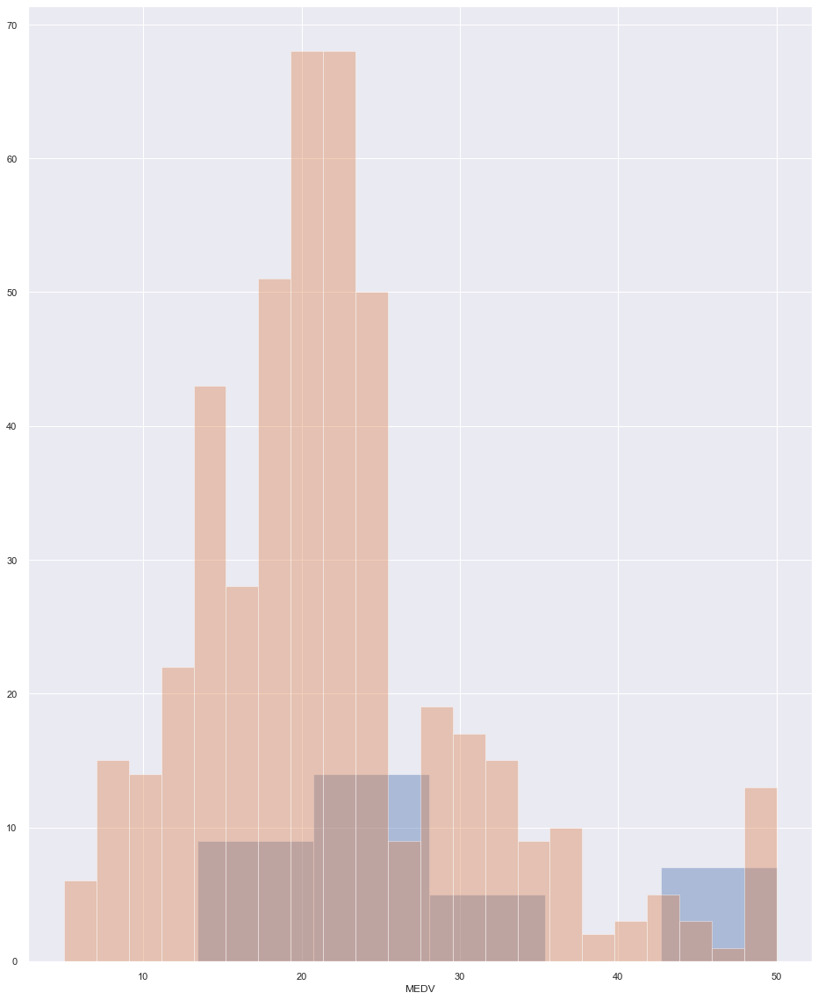

In [35]:
sns.distplot(boston.loc[boston['CHAS'] == 1]["MEDV"],  kde=False,label='Next to River')
sns.distplot(boston.loc[boston['CHAS'] != 1]["MEDV"],  kde=False,label='Not Next to River')

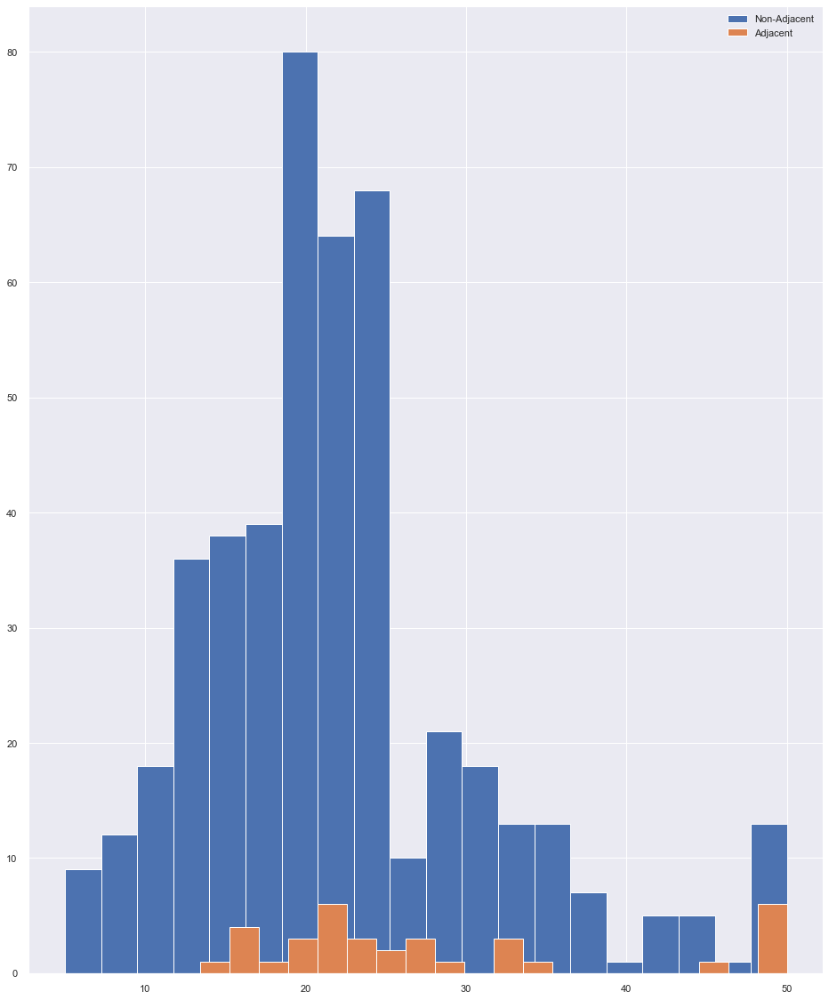

In [36]:
plt.hist(boston.loc[boston['CHAS'] != 1]["MEDV"], label='Non-Adjacent', bins = 20)
plt.hist(boston.loc[boston['CHAS'] == 1]["MEDV"], label='Adjacent', bins = 20)

plt.legend()

plt.show()

In [37]:
# Perform t-test on the two datasets:
import scipy.stats as stats
stats.ttest_ind(boston.loc[boston['CHAS'] == 1]["MEDV"], boston.loc[boston['CHAS'] == 0]["MEDV"])

Ttest_indResult(statistic=3.996437466090509, pvalue=7.390623170519905e-05)

The result above would indicate that these datasets were distinctly different with only a very small probability of the two being confused (p-value of 7.4 x 10^-5). This would appear at odds with the visual appearance of the histogram above however.  

Taking a closer look at the histogram - there appears to be a large amount of outliers in those houses adjacent to the Charles River.

In [38]:
#boston.loc[boston["MEDV"]<50.0, boston['CHAS'] == 1 ]["MEDV"]
no_chas = boston.loc[boston['CHAS'] == 0]
yes_chas = boston.loc[boston['CHAS'] == 1]

In [39]:
# Perform t-test on the two amended datasets:
stats.ttest_ind(no_chas.loc[no_chas['MEDV'] < 50.0]["MEDV"],yes_chas.loc[yes_chas["MEDV"] < 50.0]["MEDV"])

Ttest_indResult(statistic=-1.6571053443179937, pvalue=0.09814089320087695)

**Outliers**  
It is clear from the analysis to date that there appears to be a problem with the data at the higher end of the MEDV pricing. The upper limit of values appears capped at $50K. 

In [40]:
print(f"The number of rows with a MEDV value of $50K is {len(boston.loc[boston['MEDV'] == 50.0])}, which represents {len(boston.loc[boston['MEDV'] == 50.0])*100/len(boston)}% of the values")

The number of rows with a MEDV value of $50K is 16, which represents 3.1620553359683794% of the values


In [41]:
# List the top 5 most frequent house prices
boston['MEDV'].value_counts().head()

50.0    16
25.0     8
23.1     7
21.7     7
22.0     7
Name: MEDV, dtype: int64

This is at twice the frequency of any and every other value. It is likely that there was a cap put on the upper end of the MEDV values and as such this contaminates the dataset. We have no way of knowing if the \\$50K is really \\$50K or \\$50M or more. We must therefore exclude these values from further analysis.   

Rather than just pick on this value we will exclude values that fall outside two standard deviations of the mean. This should to exclude any other less obvious issues.

In [42]:
# Remove all rows where the specified column is +/- sd standard deviations
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean())
                          >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)

In [43]:
remove_outliers(boston, "MEDV", 2)


Re-analysis

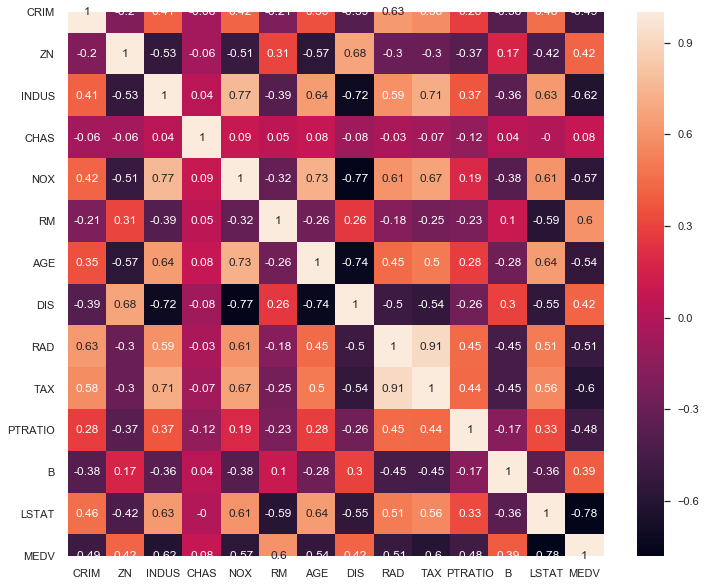

In [44]:
sns.set(rc={'figure.figsize':(12,10)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

In [45]:
# Get the regression lines using the non-outlier data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

Removing the outliers has a significant effect on the correlation coefficients with respect to MEDV. Previously, with the outliers included only LSTAT (-0.74), RM (0.7) and PTRATIO (-0.51) had absolute coefficients greater than 0.5. With the outliers removed INDUS(-0.62), NOX(-0.57), AGE (-0.54), RAD(-0.51), TAX (-0.6) are also included in that list. Interestingly however PTRATIO has decreased to -0.48 and RM, one of the two most highly correlated variables has decreased to 0.6 from 0.7.

In [46]:
table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+--------------+-------------+-------------+-------------+-------------+
| Category   |        Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+==============+=============+=============+=============+=============+
| CRIM       |  -0.634937   |   17.0222   |   -0.488403 | 7.62853e-30 | 0.0521609   |
+------------+--------------+-------------+-------------+-------------+-------------+
| ZN         |   1.37515    |  -18.1065   |    0.419465 | 1.14894e-21 | 0.136836    |
+------------+--------------+-------------+-------------+-------------+-------------+
| INDUS      |  -0.621985   |   24.2989   |   -0.620829 | 5.85041e-52 | 0.036113    |
+------------+--------------+-------------+-------------+-------------+-------------+
| NOX        |  -0.00983621 |    0.761699 |   -0.5706   | 2.22557e-42 | 0.000650922 |
+------------+--------------+-------------+-------------+-------------+-------------+
| RM         |   0.0527443  |    5.09299  |    0.60275

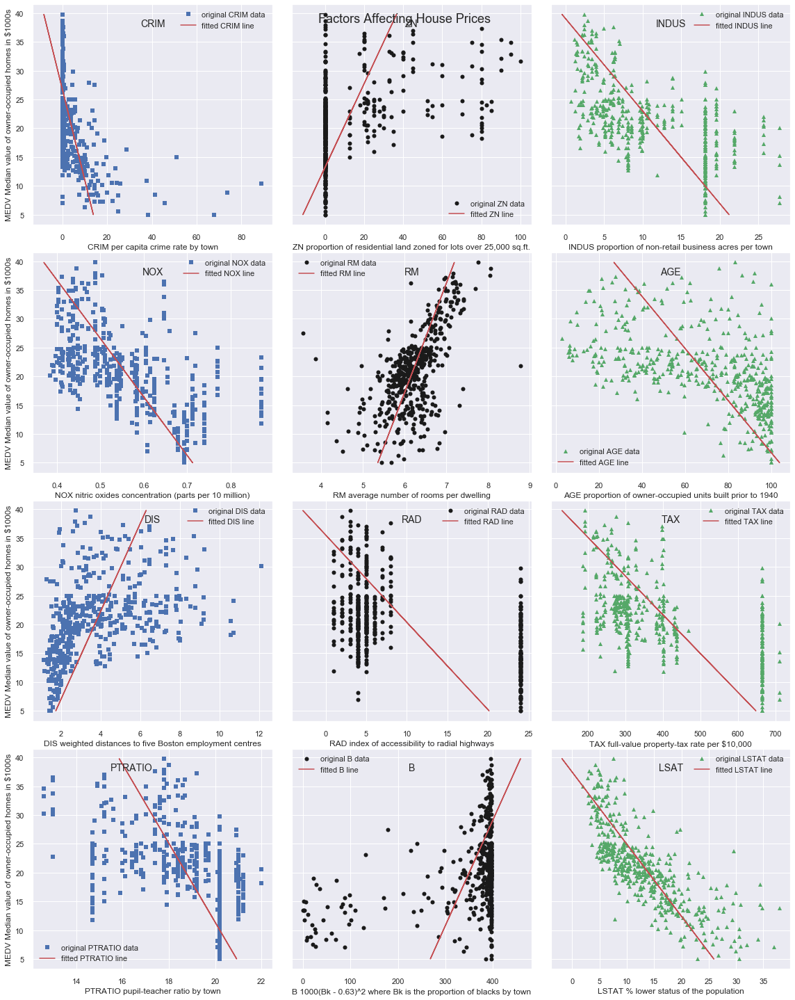

In [47]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

In [48]:
# Perform t-test on the with putliers removed:
stats.ttest_ind(boston.loc[boston['CHAS'] < 1]["MEDV"],boston.loc[boston["CHAS"] == 1.0]["MEDV"])

Ttest_indResult(statistic=-1.8389265568521393, pvalue=0.06655266530833404)

With the outliers removed - it is not possible to distinguish the two datasets.

In [49]:
import keras as ks

Using TensorFlow backend.


In [50]:
boston_all = pd.DataFrame(bhp.data, columns=bhp.feature_names)

In [58]:
from sklearn import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping

In [60]:
# Divide the dataset into inputs and outputs
# Inputs = the data we know
# Output = what we are looking for
inputs_no = boston[['LSTAT', 'RM', 'INDUS', 'AGE','TAX', 'PTRATIO']]
outputs_no = boston['MEDV']
# Build the neural network
model_no = Sequential()
model_no.add(Dense(25, input_dim=inputs_no.shape[1], activation='relu')) # Hidden 1
model_no.add(Dense(10, activation='relu')) # Hidden 2
model_no.add(Dense(1)) # Output
model_no.compile(loss='mean_squared_error', optimizer='adam')
model_no.fit(inputs_no,outputs_no,verbose=2,epochs=1000)

Train on 475 samples
Epoch 1/1000
475/475 - 0s - loss: 9770.8011
Epoch 2/1000
475/475 - 0s - loss: 3497.2471
Epoch 3/1000
475/475 - 0s - loss: 1262.7359
Epoch 4/1000
475/475 - 0s - loss: 432.6588
Epoch 5/1000
475/475 - 0s - loss: 186.3535
Epoch 6/1000
475/475 - 0s - loss: 154.7409
Epoch 7/1000
475/475 - 0s - loss: 153.5074
Epoch 8/1000
475/475 - 0s - loss: 151.6293
Epoch 9/1000
475/475 - 0s - loss: 150.4785
Epoch 10/1000
475/475 - 0s - loss: 149.4196
Epoch 11/1000
475/475 - 0s - loss: 148.6697
Epoch 12/1000
475/475 - 0s - loss: 148.1328
Epoch 13/1000
475/475 - 0s - loss: 147.0801
Epoch 14/1000
475/475 - 0s - loss: 146.2126
Epoch 15/1000
475/475 - 0s - loss: 145.3766
Epoch 16/1000
475/475 - 0s - loss: 144.7034
Epoch 17/1000
475/475 - 0s - loss: 143.5244
Epoch 18/1000
475/475 - 0s - loss: 142.5316
Epoch 19/1000
475/475 - 0s - loss: 141.7281
Epoch 20/1000
475/475 - 0s - loss: 140.6693
Epoch 21/1000
475/475 - 0s - loss: 139.7591
Epoch 22/1000
475/475 - 0s - loss: 138.9553
Epoch 23/1000
475

Epoch 188/1000
475/475 - 0s - loss: 20.0188
Epoch 189/1000
475/475 - 0s - loss: 19.6879
Epoch 190/1000
475/475 - 0s - loss: 19.7223
Epoch 191/1000
475/475 - 0s - loss: 19.7188
Epoch 192/1000
475/475 - 0s - loss: 19.7087
Epoch 193/1000
475/475 - 0s - loss: 19.7765
Epoch 194/1000
475/475 - 0s - loss: 19.5535
Epoch 195/1000
475/475 - 0s - loss: 19.4643
Epoch 196/1000
475/475 - 0s - loss: 20.3130
Epoch 197/1000
475/475 - 0s - loss: 19.7519
Epoch 198/1000
475/475 - 0s - loss: 20.0428
Epoch 199/1000
475/475 - 0s - loss: 19.7099
Epoch 200/1000
475/475 - 0s - loss: 19.8550
Epoch 201/1000
475/475 - 0s - loss: 19.6520
Epoch 202/1000
475/475 - 0s - loss: 19.4388
Epoch 203/1000
475/475 - 0s - loss: 19.4736
Epoch 204/1000
475/475 - 0s - loss: 19.3188
Epoch 205/1000
475/475 - 0s - loss: 19.3593
Epoch 206/1000
475/475 - 0s - loss: 19.3811
Epoch 207/1000
475/475 - 0s - loss: 19.5771
Epoch 208/1000
475/475 - 0s - loss: 19.4682
Epoch 209/1000
475/475 - 0s - loss: 19.2720
Epoch 210/1000
475/475 - 0s - lo

Epoch 375/1000
475/475 - 0s - loss: 18.4435
Epoch 376/1000
475/475 - 0s - loss: 18.0422
Epoch 377/1000
475/475 - 0s - loss: 17.5313
Epoch 378/1000
475/475 - 0s - loss: 16.8198
Epoch 379/1000
475/475 - 0s - loss: 16.8941
Epoch 380/1000
475/475 - 0s - loss: 17.0042
Epoch 381/1000
475/475 - 0s - loss: 16.9516
Epoch 382/1000
475/475 - 0s - loss: 17.0932
Epoch 383/1000
475/475 - 0s - loss: 17.2493
Epoch 384/1000
475/475 - 0s - loss: 18.1347
Epoch 385/1000
475/475 - 0s - loss: 17.0078
Epoch 386/1000
475/475 - 0s - loss: 16.7175
Epoch 387/1000
475/475 - 0s - loss: 17.1655
Epoch 388/1000
475/475 - 0s - loss: 16.8007
Epoch 389/1000
475/475 - 0s - loss: 16.8788
Epoch 390/1000
475/475 - 0s - loss: 17.9553
Epoch 391/1000
475/475 - 0s - loss: 17.1196
Epoch 392/1000
475/475 - 0s - loss: 16.7999
Epoch 393/1000
475/475 - 0s - loss: 16.9503
Epoch 394/1000
475/475 - 0s - loss: 17.4107
Epoch 395/1000
475/475 - 0s - loss: 17.0143
Epoch 396/1000
475/475 - 0s - loss: 16.8277
Epoch 397/1000
475/475 - 0s - lo

Epoch 562/1000
475/475 - 0s - loss: 15.3947
Epoch 563/1000
475/475 - 0s - loss: 15.3050
Epoch 564/1000
475/475 - 0s - loss: 15.2241
Epoch 565/1000
475/475 - 0s - loss: 15.1992
Epoch 566/1000
475/475 - 0s - loss: 15.1899
Epoch 567/1000
475/475 - 0s - loss: 15.2008
Epoch 568/1000
475/475 - 0s - loss: 15.3752
Epoch 569/1000
475/475 - 0s - loss: 15.5220
Epoch 570/1000
475/475 - 0s - loss: 16.2270
Epoch 571/1000
475/475 - 0s - loss: 15.5516
Epoch 572/1000
475/475 - 0s - loss: 15.7526
Epoch 573/1000
475/475 - 0s - loss: 15.3498
Epoch 574/1000
475/475 - 0s - loss: 15.0722
Epoch 575/1000
475/475 - 0s - loss: 15.2188
Epoch 576/1000
475/475 - 0s - loss: 15.1573
Epoch 577/1000
475/475 - 0s - loss: 15.0511
Epoch 578/1000
475/475 - 0s - loss: 15.6513
Epoch 579/1000
475/475 - 0s - loss: 16.0519
Epoch 580/1000
475/475 - 0s - loss: 14.8510
Epoch 581/1000
475/475 - 0s - loss: 15.1241
Epoch 582/1000
475/475 - 0s - loss: 15.0743
Epoch 583/1000
475/475 - 0s - loss: 15.2440
Epoch 584/1000
475/475 - 0s - lo

Epoch 749/1000
475/475 - 0s - loss: 14.0597
Epoch 750/1000
475/475 - 0s - loss: 13.7327
Epoch 751/1000
475/475 - 0s - loss: 13.5549
Epoch 752/1000
475/475 - 0s - loss: 13.8234
Epoch 753/1000
475/475 - 0s - loss: 13.5166
Epoch 754/1000
475/475 - 0s - loss: 13.7914
Epoch 755/1000
475/475 - 0s - loss: 13.4667
Epoch 756/1000
475/475 - 0s - loss: 13.8668
Epoch 757/1000
475/475 - 0s - loss: 13.3771
Epoch 758/1000
475/475 - 0s - loss: 13.4402
Epoch 759/1000
475/475 - 0s - loss: 13.4158
Epoch 760/1000
475/475 - 0s - loss: 13.2956
Epoch 761/1000
475/475 - 0s - loss: 13.5606
Epoch 762/1000
475/475 - 0s - loss: 14.2830
Epoch 763/1000
475/475 - 0s - loss: 15.5787
Epoch 764/1000
475/475 - 0s - loss: 13.9985
Epoch 765/1000
475/475 - 0s - loss: 13.3031
Epoch 766/1000
475/475 - 0s - loss: 13.3556
Epoch 767/1000
475/475 - 0s - loss: 13.5605
Epoch 768/1000
475/475 - 0s - loss: 14.7995
Epoch 769/1000
475/475 - 0s - loss: 13.3527
Epoch 770/1000
475/475 - 0s - loss: 13.3622
Epoch 771/1000
475/475 - 0s - lo

Epoch 936/1000
475/475 - 0s - loss: 12.8964
Epoch 937/1000
475/475 - 0s - loss: 12.6609
Epoch 938/1000
475/475 - 0s - loss: 13.1121
Epoch 939/1000
475/475 - 0s - loss: 13.7498
Epoch 940/1000
475/475 - 0s - loss: 12.8298
Epoch 941/1000
475/475 - 0s - loss: 12.6846
Epoch 942/1000
475/475 - 0s - loss: 12.7248
Epoch 943/1000
475/475 - 0s - loss: 13.2821
Epoch 944/1000
475/475 - 0s - loss: 12.7431
Epoch 945/1000
475/475 - 0s - loss: 12.9468
Epoch 946/1000
475/475 - 0s - loss: 12.8411
Epoch 947/1000
475/475 - 0s - loss: 13.6563
Epoch 948/1000
475/475 - 0s - loss: 13.4483
Epoch 949/1000
475/475 - 0s - loss: 13.8418
Epoch 950/1000
475/475 - 0s - loss: 12.6093
Epoch 951/1000
475/475 - 0s - loss: 12.7967
Epoch 952/1000
475/475 - 0s - loss: 12.5854
Epoch 953/1000
475/475 - 0s - loss: 12.7550
Epoch 954/1000
475/475 - 0s - loss: 12.8954
Epoch 955/1000
475/475 - 0s - loss: 13.0869
Epoch 956/1000
475/475 - 0s - loss: 12.6728
Epoch 957/1000
475/475 - 0s - loss: 12.7285
Epoch 958/1000
475/475 - 0s - lo

In [61]:
pred_no = model_no.predict(inputs_no)
print("Shape: {}".format(pred_no.shape))
print(pred_no)

Shape: (475, 1)
[[27.801228 ]
 [24.785223 ]
 [30.99288  ]
 [31.043556 ]
 [30.537722 ]
 [27.111418 ]
 [21.511433 ]
 [20.732994 ]
 [16.79921  ]
 [19.052904 ]
 [20.16077  ]
 [20.826948 ]
 [19.982023 ]
 [22.162165 ]
 [21.557686 ]
 [21.621387 ]
 [23.434546 ]
 [19.154549 ]
 [18.823996 ]
 [19.632519 ]
 [16.309946 ]
 [19.270634 ]
 [17.898802 ]
 [17.643488 ]
 [17.893278 ]
 [16.414299 ]
 [18.096525 ]
 [18.139252 ]
 [22.142448 ]
 [23.483498 ]
 [14.965359 ]
 [20.6192   ]
 [13.187107 ]
 [16.736359 ]
 [17.188112 ]
 [21.94532  ]
 [20.868113 ]
 [22.443743 ]
 [22.59818  ]
 [28.775223 ]
 [31.953459 ]
 [29.914103 ]
 [26.600668 ]
 [26.12123  ]
 [23.705341 ]
 [21.693151 ]
 [20.53109  ]
 [18.592823 ]
 [13.931743 ]
 [18.146215 ]
 [21.5328   ]
 [23.71576  ]
 [28.196157 ]
 [24.365734 ]
 [18.134933 ]
 [31.98551  ]
 [26.662546 ]
 [30.226995 ]
 [24.817404 ]
 [22.410301 ]
 [19.441502 ]
 [19.438486 ]
 [25.641722 ]
 [26.312025 ]
 [29.12503  ]
 [26.96604  ]
 [21.873724 ]
 [22.785439 ]
 [18.94901  ]
 [22.30078  ]
 [26

In [62]:
# Measure RMSE error.  RMSE is common for regression.
score_no = np.sqrt(metrics.mean_squared_error(pred_no,outputs_no))
print(f"Final score (RMSE): {score_no}")

Final score (RMSE): 3.530749726031068


In [63]:
# Sample predictions
for i in range(10):
    print(f"{i+1}. LSTAT: {inputs_no['LSTAT'][i]}, RM: {inputs_no['RM'][i]} Actual MEDV: {outputs_no[i]}, predicted MEDV: {pred_no[i]}")

1. LSTAT: 4.98, RM: 6.575 Actual MEDV: 24.0, predicted MEDV: [27.801228]
2. LSTAT: 9.14, RM: 6.421 Actual MEDV: 21.6, predicted MEDV: [24.785223]
3. LSTAT: 4.03, RM: 7.185 Actual MEDV: 34.7, predicted MEDV: [30.99288]
4. LSTAT: 2.94, RM: 6.998 Actual MEDV: 33.4, predicted MEDV: [31.043556]
5. LSTAT: 5.33, RM: 7.147 Actual MEDV: 36.2, predicted MEDV: [30.537722]
6. LSTAT: 5.21, RM: 6.43 Actual MEDV: 28.7, predicted MEDV: [27.111418]
7. LSTAT: 12.43, RM: 6.012 Actual MEDV: 22.9, predicted MEDV: [21.511433]
8. LSTAT: 19.15, RM: 6.172 Actual MEDV: 27.1, predicted MEDV: [20.732994]
9. LSTAT: 29.93, RM: 5.631 Actual MEDV: 16.5, predicted MEDV: [16.79921]
10. LSTAT: 17.1, RM: 6.004 Actual MEDV: 18.9, predicted MEDV: [19.052904]


**With Outliers**

In [66]:
# Divide the dataset into inputs and outputs
# Inputs = the data we know
# Output = what we are looking for
inputs_all = boston[['LSTAT', 'RM', 'INDUS', 'AGE','TAX', 'PTRATIO']]
outputs_all = boston['MEDV']
# Build the neural network
model_all = Sequential()
model_all.add(Dense(25, input_dim=inputs_all.shape[1], activation='relu')) # Hidden 1
model_all.add(Dense(10, activation='relu')) # Hidden 2
model_all.add(Dense(1)) # Output
model_all.compile(loss='mean_squared_error', optimizer='adam')
model_all.fit(inputs_all,outputs_all,verbose=2,epochs=1000)

Train on 475 samples
Epoch 1/1000
475/475 - 0s - loss: 14588.0582
Epoch 2/1000
475/475 - 0s - loss: 1924.3468
Epoch 3/1000
475/475 - 0s - loss: 412.4931
Epoch 4/1000
475/475 - 0s - loss: 288.0641
Epoch 5/1000
475/475 - 0s - loss: 204.5421
Epoch 6/1000
475/475 - 0s - loss: 192.9163
Epoch 7/1000
475/475 - 0s - loss: 189.9753
Epoch 8/1000
475/475 - 0s - loss: 186.2282
Epoch 9/1000
475/475 - 0s - loss: 181.6344
Epoch 10/1000
475/475 - 0s - loss: 178.3103
Epoch 11/1000
475/475 - 0s - loss: 174.9532
Epoch 12/1000
475/475 - 0s - loss: 170.9586
Epoch 13/1000
475/475 - 0s - loss: 168.2872
Epoch 14/1000
475/475 - 0s - loss: 163.9667
Epoch 15/1000
475/475 - 0s - loss: 160.9560
Epoch 16/1000
475/475 - 0s - loss: 157.4801
Epoch 17/1000
475/475 - 0s - loss: 153.6517
Epoch 18/1000
475/475 - 0s - loss: 150.8490
Epoch 19/1000
475/475 - 0s - loss: 147.4208
Epoch 20/1000
475/475 - 0s - loss: 144.5885
Epoch 21/1000
475/475 - 0s - loss: 140.7256
Epoch 22/1000
475/475 - 0s - loss: 137.7679
Epoch 23/1000
475

Epoch 189/1000
475/475 - 0s - loss: 23.5474
Epoch 190/1000
475/475 - 0s - loss: 23.7679
Epoch 191/1000
475/475 - 0s - loss: 23.9003
Epoch 192/1000
475/475 - 0s - loss: 23.6152
Epoch 193/1000
475/475 - 0s - loss: 23.1332
Epoch 194/1000
475/475 - 0s - loss: 23.1267
Epoch 195/1000
475/475 - 0s - loss: 22.9796
Epoch 196/1000
475/475 - 0s - loss: 23.3968
Epoch 197/1000
475/475 - 0s - loss: 22.9959
Epoch 198/1000
475/475 - 0s - loss: 23.4063
Epoch 199/1000
475/475 - 0s - loss: 25.5993
Epoch 200/1000
475/475 - 0s - loss: 22.7617
Epoch 201/1000
475/475 - 0s - loss: 22.6136
Epoch 202/1000
475/475 - 0s - loss: 22.8713
Epoch 203/1000
475/475 - 0s - loss: 22.5649
Epoch 204/1000
475/475 - 0s - loss: 22.8297
Epoch 205/1000
475/475 - 0s - loss: 23.0669
Epoch 206/1000
475/475 - 0s - loss: 23.4469
Epoch 207/1000
475/475 - 0s - loss: 24.6765
Epoch 208/1000
475/475 - 0s - loss: 25.3997
Epoch 209/1000
475/475 - 0s - loss: 24.8974
Epoch 210/1000
475/475 - 0s - loss: 22.2280
Epoch 211/1000
475/475 - 0s - lo

Epoch 376/1000
475/475 - 0s - loss: 17.3585
Epoch 377/1000
475/475 - 0s - loss: 17.5684
Epoch 378/1000
475/475 - 0s - loss: 19.1792
Epoch 379/1000
475/475 - 0s - loss: 17.3165
Epoch 380/1000
475/475 - 0s - loss: 16.7230
Epoch 381/1000
475/475 - 0s - loss: 16.5571
Epoch 382/1000
475/475 - 0s - loss: 16.6913
Epoch 383/1000
475/475 - 0s - loss: 16.6162
Epoch 384/1000
475/475 - 0s - loss: 16.3226
Epoch 385/1000
475/475 - 0s - loss: 16.9694
Epoch 386/1000
475/475 - 0s - loss: 18.6569
Epoch 387/1000
475/475 - 0s - loss: 19.0283
Epoch 388/1000
475/475 - 0s - loss: 17.8202
Epoch 389/1000
475/475 - 0s - loss: 17.1814
Epoch 390/1000
475/475 - 0s - loss: 19.3716
Epoch 391/1000
475/475 - 0s - loss: 17.3897
Epoch 392/1000
475/475 - 0s - loss: 16.1541
Epoch 393/1000
475/475 - 0s - loss: 17.0600
Epoch 394/1000
475/475 - 0s - loss: 16.2518
Epoch 395/1000
475/475 - 0s - loss: 16.6549
Epoch 396/1000
475/475 - 0s - loss: 16.4435
Epoch 397/1000
475/475 - 0s - loss: 16.0340
Epoch 398/1000
475/475 - 0s - lo

Epoch 563/1000
475/475 - 0s - loss: 15.0614
Epoch 564/1000
475/475 - 0s - loss: 14.5923
Epoch 565/1000
475/475 - 0s - loss: 15.3111
Epoch 566/1000
475/475 - 0s - loss: 15.2909
Epoch 567/1000
475/475 - 0s - loss: 15.3099
Epoch 568/1000
475/475 - 0s - loss: 16.4919
Epoch 569/1000
475/475 - 0s - loss: 16.2757
Epoch 570/1000
475/475 - 0s - loss: 17.0238
Epoch 571/1000
475/475 - 0s - loss: 14.5367
Epoch 572/1000
475/475 - 0s - loss: 14.8387
Epoch 573/1000
475/475 - 0s - loss: 14.6351
Epoch 574/1000
475/475 - 0s - loss: 14.8452
Epoch 575/1000
475/475 - 0s - loss: 14.1899
Epoch 576/1000
475/475 - 0s - loss: 15.4138
Epoch 577/1000
475/475 - 0s - loss: 18.8656
Epoch 578/1000
475/475 - 0s - loss: 16.0307
Epoch 579/1000
475/475 - 0s - loss: 14.8477
Epoch 580/1000
475/475 - 0s - loss: 14.6852
Epoch 581/1000
475/475 - 0s - loss: 17.1251
Epoch 582/1000
475/475 - 0s - loss: 14.6338
Epoch 583/1000
475/475 - 0s - loss: 14.7598
Epoch 584/1000
475/475 - 0s - loss: 13.8068
Epoch 585/1000
475/475 - 0s - lo

475/475 - 0s - loss: 13.2093
Epoch 750/1000
475/475 - 0s - loss: 12.9548
Epoch 751/1000
475/475 - 0s - loss: 15.4834
Epoch 752/1000
475/475 - 0s - loss: 15.9912
Epoch 753/1000
475/475 - 0s - loss: 15.7589
Epoch 754/1000
475/475 - 0s - loss: 13.7159
Epoch 755/1000
475/475 - 0s - loss: 13.6449
Epoch 756/1000
475/475 - 0s - loss: 13.4870
Epoch 757/1000
475/475 - 0s - loss: 14.8187
Epoch 758/1000
475/475 - 0s - loss: 12.9781
Epoch 759/1000
475/475 - 0s - loss: 13.3579
Epoch 760/1000
475/475 - 0s - loss: 16.6185
Epoch 761/1000
475/475 - 0s - loss: 15.4792
Epoch 762/1000
475/475 - 0s - loss: 14.0435
Epoch 763/1000
475/475 - 0s - loss: 14.6753
Epoch 764/1000
475/475 - 0s - loss: 14.1722
Epoch 765/1000
475/475 - 0s - loss: 15.9313
Epoch 766/1000
475/475 - 0s - loss: 13.2944
Epoch 767/1000
475/475 - 0s - loss: 14.3944
Epoch 768/1000
475/475 - 0s - loss: 14.5820
Epoch 769/1000
475/475 - 0s - loss: 14.0444
Epoch 770/1000
475/475 - 0s - loss: 14.8990
Epoch 771/1000
475/475 - 0s - loss: 13.2150
Epo

Epoch 936/1000
475/475 - 0s - loss: 12.5099
Epoch 937/1000
475/475 - 0s - loss: 12.7801
Epoch 938/1000
475/475 - 0s - loss: 12.9456
Epoch 939/1000
475/475 - 0s - loss: 13.5743
Epoch 940/1000
475/475 - 0s - loss: 13.2521
Epoch 941/1000
475/475 - 0s - loss: 13.3878
Epoch 942/1000
475/475 - 0s - loss: 12.4231
Epoch 943/1000
475/475 - 0s - loss: 12.7971
Epoch 944/1000
475/475 - 0s - loss: 12.9134
Epoch 945/1000
475/475 - 0s - loss: 14.3370
Epoch 946/1000
475/475 - 0s - loss: 12.7831
Epoch 947/1000
475/475 - 0s - loss: 12.8908
Epoch 948/1000
475/475 - 0s - loss: 13.9533
Epoch 949/1000
475/475 - 0s - loss: 15.8315
Epoch 950/1000
475/475 - 0s - loss: 13.4897
Epoch 951/1000
475/475 - 0s - loss: 12.4647
Epoch 952/1000
475/475 - 0s - loss: 12.3628
Epoch 953/1000
475/475 - 0s - loss: 13.2206
Epoch 954/1000
475/475 - 0s - loss: 13.3533
Epoch 955/1000
475/475 - 0s - loss: 12.7438
Epoch 956/1000
475/475 - 0s - loss: 13.2191
Epoch 957/1000
475/475 - 0s - loss: 13.1343
Epoch 958/1000
475/475 - 0s - lo

In [67]:
pred_all = model_all.predict(inputs_no)
print("Shape: {}".format(pred_all.shape))
print(pred_all)

Shape: (475, 1)
[[25.851143  ]
 [23.681038  ]
 [29.141487  ]
 [28.814823  ]
 [28.907207  ]
 [25.263657  ]
 [20.638905  ]
 [19.275543  ]
 [13.738883  ]
 [19.026287  ]
 [19.967686  ]
 [20.090858  ]
 [19.700886  ]
 [18.598164  ]
 [18.404434  ]
 [18.0528    ]
 [19.588879  ]
 [16.781963  ]
 [15.661082  ]
 [16.526867  ]
 [12.833159  ]
 [16.721535  ]
 [16.33683   ]
 [14.42089   ]
 [15.7991705 ]
 [14.210582  ]
 [15.663028  ]
 [16.270481  ]
 [19.625359  ]
 [20.89946   ]
 [13.099799  ]
 [17.529675  ]
 [13.231727  ]
 [14.130244  ]
 [15.646934  ]
 [19.58636   ]
 [18.800179  ]
 [19.910114  ]
 [20.382225  ]
 [26.37896   ]
 [29.313831  ]
 [26.719906  ]
 [24.63831   ]
 [24.44033   ]
 [22.513103  ]
 [20.46315   ]
 [20.002422  ]
 [19.677433  ]
 [13.608592  ]
 [17.966843  ]
 [21.22173   ]
 [22.69983   ]
 [26.626694  ]
 [23.16103   ]
 [14.329436  ]
 [30.429016  ]
 [23.869732  ]
 [28.825108  ]
 [21.81546   ]
 [19.733097  ]
 [17.394978  ]
 [17.925217  ]
 [22.705425  ]
 [24.054695  ]
 [28.21951   ]
 [24.0684

In [68]:
# Measure RMSE error.  RMSE is common for regression.
score_all = np.sqrt(metrics.mean_squared_error(pred_all,outputs_all))
print(f"Final score (RMSE): {score_all}")

Final score (RMSE): 4.236826327958288


In [69]:
# Sample predictions
for i in range(10):
    print(f"{i+1}. LSTAT: {inputs_all['LSTAT'][i]}, RM: {inputs_all['RM'][i]} Actual MEDV: {outputs_all[i]}, predicted MEDV: {pred_all[i]}")

1. LSTAT: 4.98, RM: 6.575 Actual MEDV: 24.0, predicted MEDV: [25.851143]
2. LSTAT: 9.14, RM: 6.421 Actual MEDV: 21.6, predicted MEDV: [23.681038]
3. LSTAT: 4.03, RM: 7.185 Actual MEDV: 34.7, predicted MEDV: [29.141487]
4. LSTAT: 2.94, RM: 6.998 Actual MEDV: 33.4, predicted MEDV: [28.814823]
5. LSTAT: 5.33, RM: 7.147 Actual MEDV: 36.2, predicted MEDV: [28.907207]
6. LSTAT: 5.21, RM: 6.43 Actual MEDV: 28.7, predicted MEDV: [25.263657]
7. LSTAT: 12.43, RM: 6.012 Actual MEDV: 22.9, predicted MEDV: [20.638905]
8. LSTAT: 19.15, RM: 6.172 Actual MEDV: 27.1, predicted MEDV: [19.275543]
9. LSTAT: 29.93, RM: 5.631 Actual MEDV: 16.5, predicted MEDV: [13.738883]
10. LSTAT: 17.1, RM: 6.004 Actual MEDV: 18.9, predicted MEDV: [19.026287]


## (60%) Predict: ##
Again using the same notebook, use keras [7] to create a neural network that can predict the median house price based on the other variables in the dataset. You are free to interpret this as you wish — for example, you may use all the other variables, or select a subset. This part is worth 60%.

## References ##
[1] Boston Standard Metropolitan Statistical Area. Boston house prices dataset. https://www.kaggle.com/c/boston-housing.  
[2] https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155  
[3] https://pypi.org/project/tabulate/  
[4] Tensorflow Installation https://www.youtube.com/channel/UCR1-GEpyOPzT2AO4D_eifdw   
[5] Jeff Heaton Lecture 02-01  
[6] https://stackoverflow.com/questions/48590268/pandas-get-the-most-frequent-values-of-a-column  
[7] 